In [1]:
import torch
from torchvision import transforms
import torchvision.transforms.functional as F
import random
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = os.getenv('HOME')+'/work/data_augmentation/images/mycat.jpg'
sample_img_path

'/home/thkim0/work/data_augmentation/images/mycat.jpg'

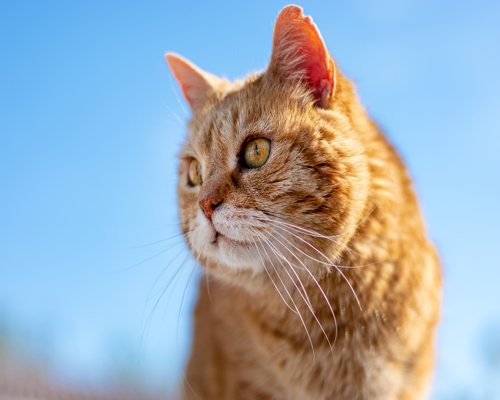

In [2]:
image = Image.open(sample_img_path).resize((500, 400)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = F.to_tensor(image) # Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255] to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0]
image

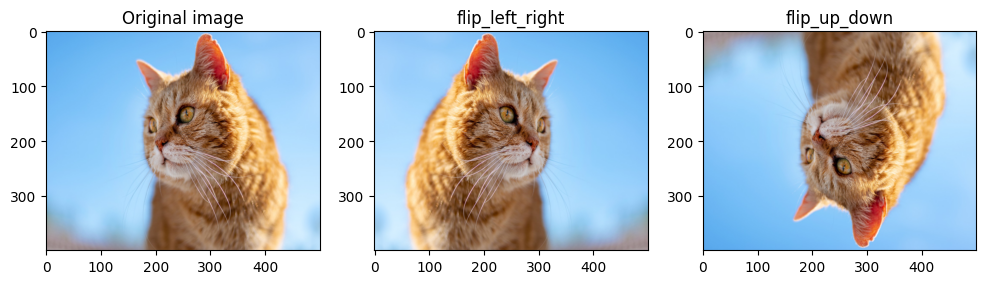

In [3]:
flip_lr_tensor = F.hflip(image_tensor)
flip_ud_tensor = F.vflip(image_tensor)
flip_lr_image = F.to_pil_image(flip_lr_tensor)
flip_ud_image = F.to_pil_image(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

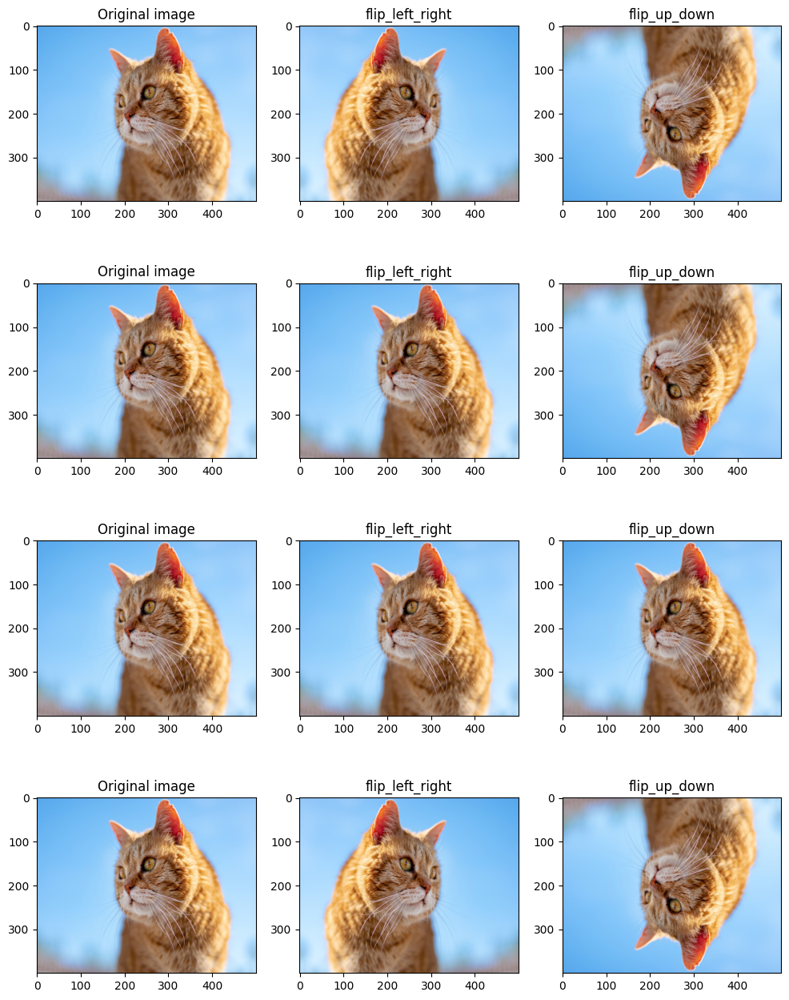

In [4]:
plt.figure(figsize=(12, 16))
random_flip_lr = transforms.RandomHorizontalFlip(p=0.5)
random_flip_ud = transforms.RandomVerticalFlip(p=0.5)

row = 4
for i in range(row):
    flip_lr_tensor = random_flip_lr(image_tensor)
    flip_ud_tensor = random_flip_ud(image_tensor)
    flip_lr_image = F.to_pil_image(flip_lr_tensor)
    flip_ud_image = F.to_pil_image(flip_ud_tensor)

    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

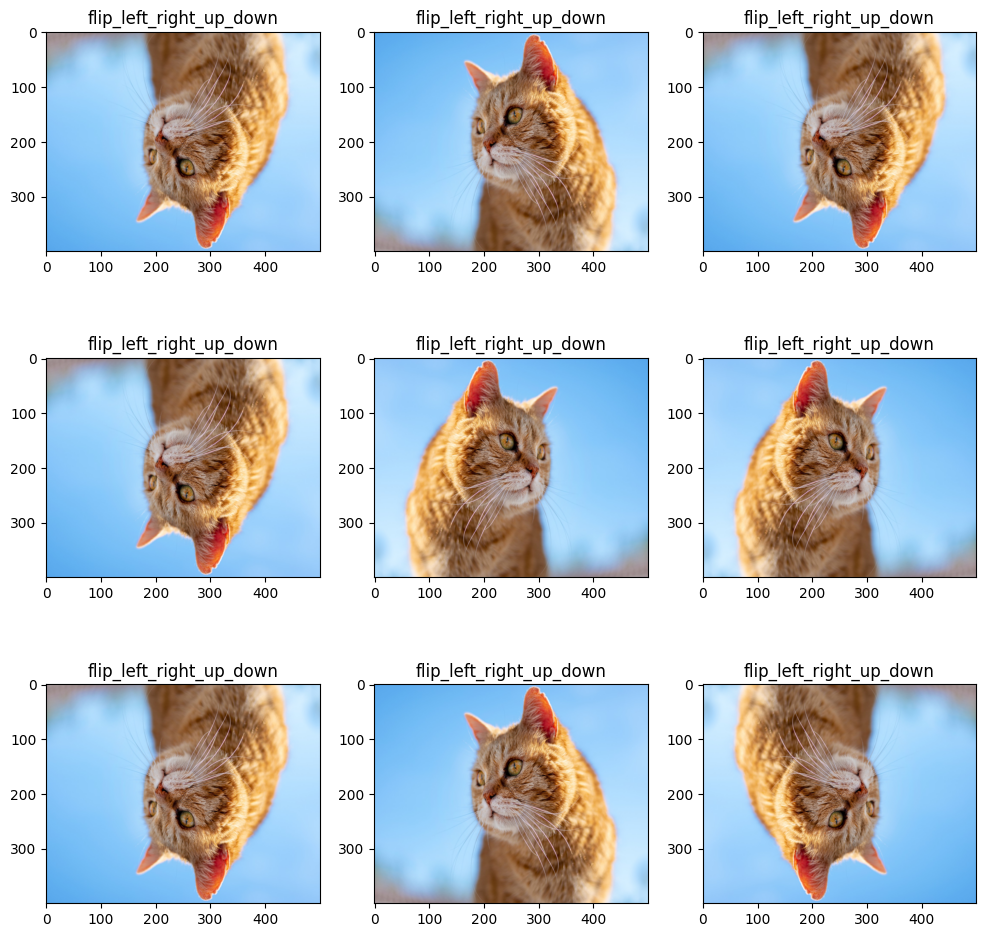

In [5]:
# Q. random_flip 을 구현하세요.

def random_flip(image_tensor):
    flip_lr_tensor = random_flip_lr(image_tensor) # hint : random_flip_left_right()
    flip_ud_lr_tensor = random_flip_ud(flip_lr_tensor) # hint : random_flip_up_down()
    flip_ud_lr_image = F.to_pil_image(flip_ud_lr_tensor) # hint : array_to_img()
    return flip_ud_lr_image

plt.figure(figsize=(12, 12))

num = 9
for i in range(num):
    plt.subplot(3,3,i+1)
    plt.title('flip_left_right_up_down')
    # hint : plt.imshow(함수)
    flipped_image = random_flip(image_tensor)
    plt.imshow(flipped_image)

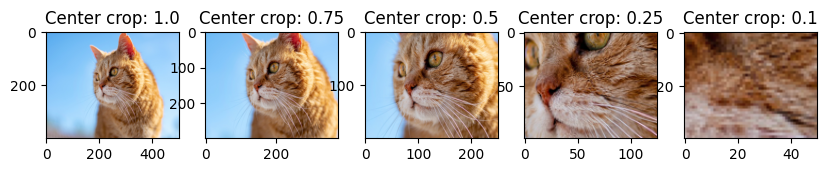

In [6]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    crop_size = (int(image_tensor.shape[1] * frac), int(image_tensor.shape[2] * frac))
    cropped_tensor = F.center_crop(image_tensor, crop_size)
    cropped_img = F.to_pil_image(cropped_tensor)

    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

In [7]:
def random_central_crop(image_tensor, range=(0, 1)):
    # range 범위에서 무작위로 잘라낼 비율을 선택합니다
    central_fraction = torch.rand(1).item() * (range[1] - range[0]) + range[0]
    crop_size = (int(image_tensor.shape[1] * central_fraction), int(image_tensor.shape[2] * central_fraction))
    cropped_tensor = F.center_crop(image_tensor, crop_size)
    return cropped_tensor
print('=3')

=3


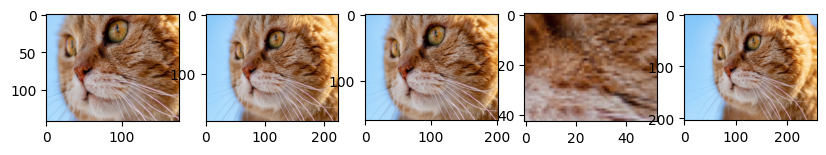

In [8]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = F.to_pil_image(cropped_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

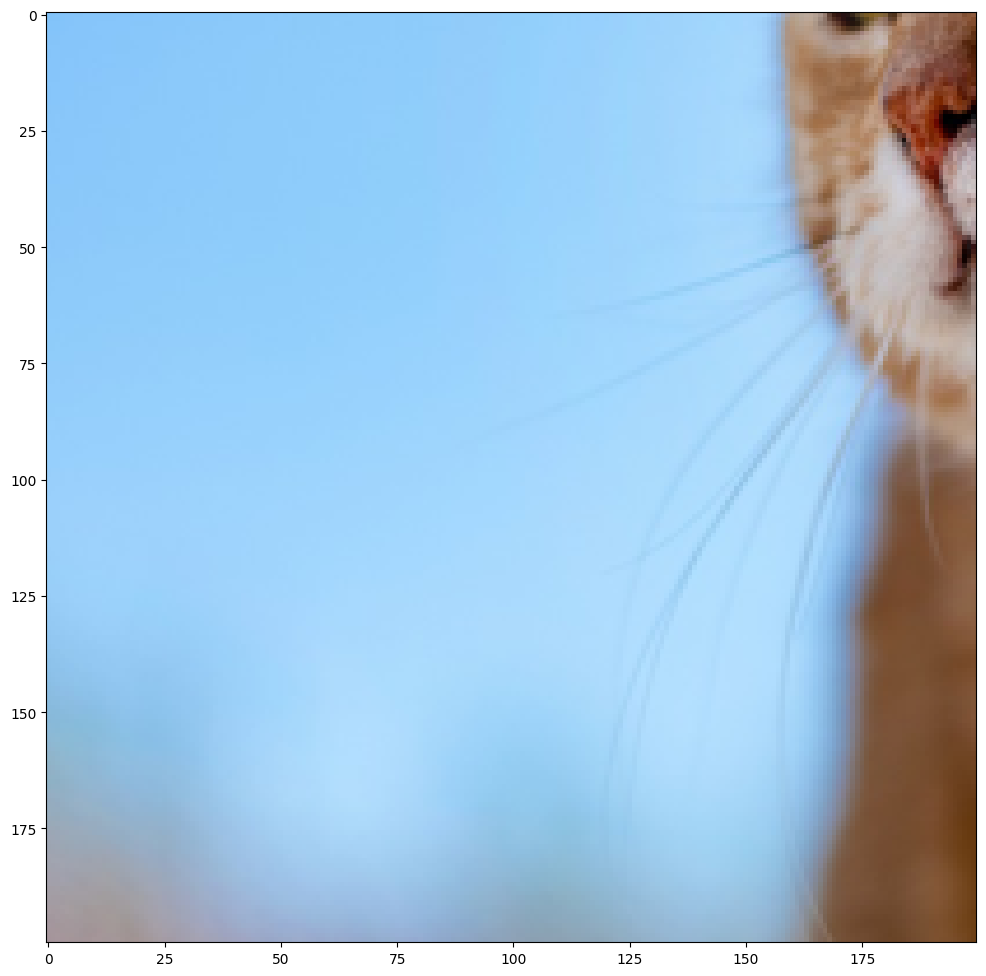

In [9]:
# apply random_crop on cat image
plt.figure(figsize=(12, 15))
random_crop = transforms.RandomCrop(size=(200,200))

random_crop_tensor = random_crop(image_tensor)
random_crop_image = F.to_pil_image(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

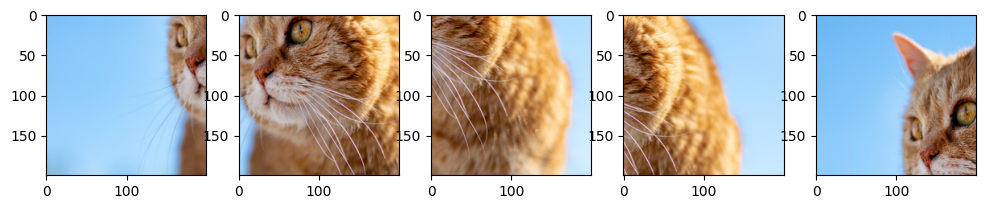

In [10]:
# display 5 random cropped images

plt.figure(figsize=(12, 15))
random_crop = transforms.RandomCrop(size=(200,200))

for i in range(5):
  random_crop_tensor = random_crop(image_tensor)
  random_crop_image = F.to_pil_image(random_crop_tensor)
  plt.subplot(1, 5, i + 1) # hint : plt.subplot()
  plt.imshow(random_crop_image)

(-0.5, 499.5, 399.5, -0.5)

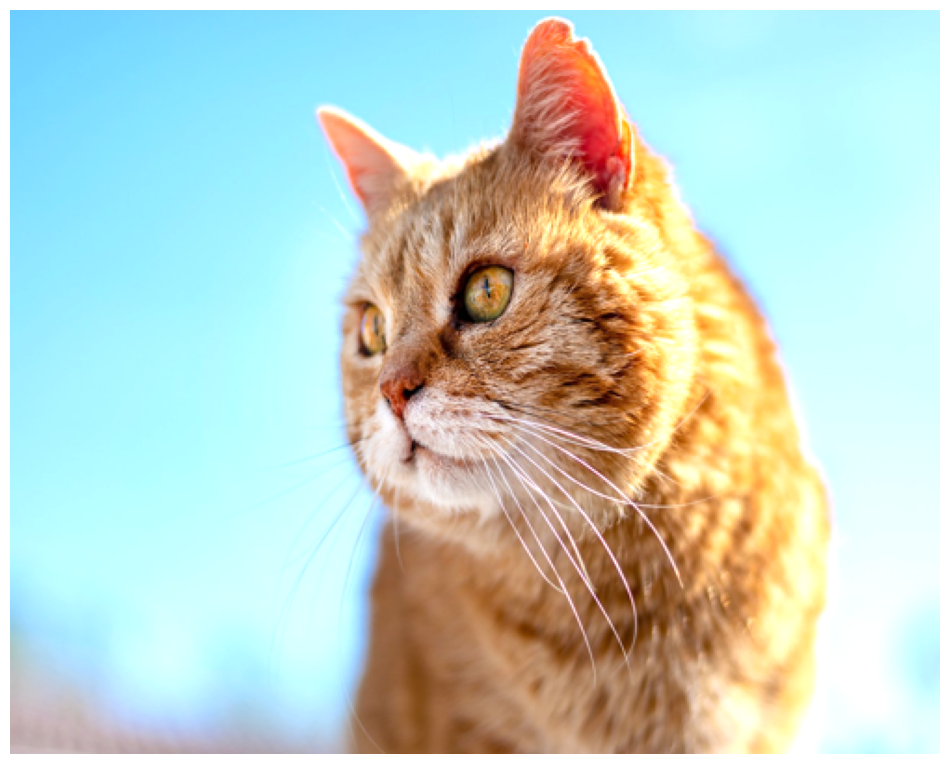

In [11]:
# apply random_brightness on cat image
plt.figure(figsize=(12, 15))
brightness_transform = transforms.ColorJitter(brightness=0.5)

random_bright_tensor = brightness_transform(image_tensor)
random_bright_image = F.to_pil_image(random_bright_tensor)

plt.imshow(random_bright_image)
plt.axis("off")
# plt.show()

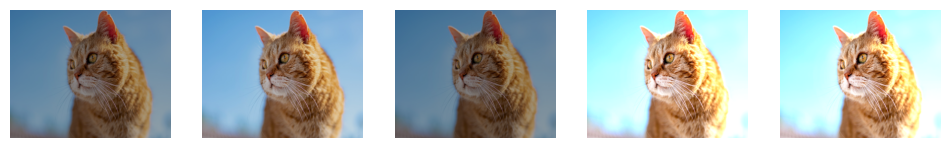

In [12]:
# display 5 random brightness images

plt.figure(figsize=(12, 15))
brightness_transform = transforms.ColorJitter(brightness=0.5)

col = 5
for i in range(5):
    random_bright_tensor = brightness_transform(image_tensor)
    random_bright_image = F.to_pil_image(random_bright_tensor)

    plt.subplot(1,col,i+1)
    plt.imshow(random_bright_image)
    plt.axis("off")

In [13]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [14]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)
    
print("슝")

슝


/home/thkim0/venv/v1/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


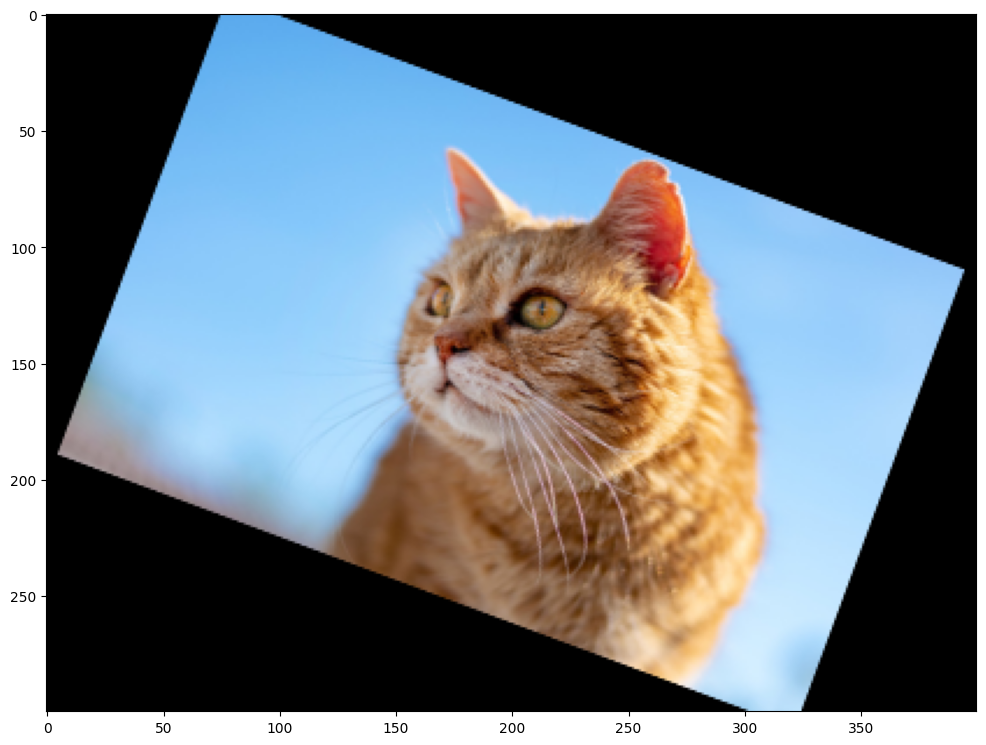

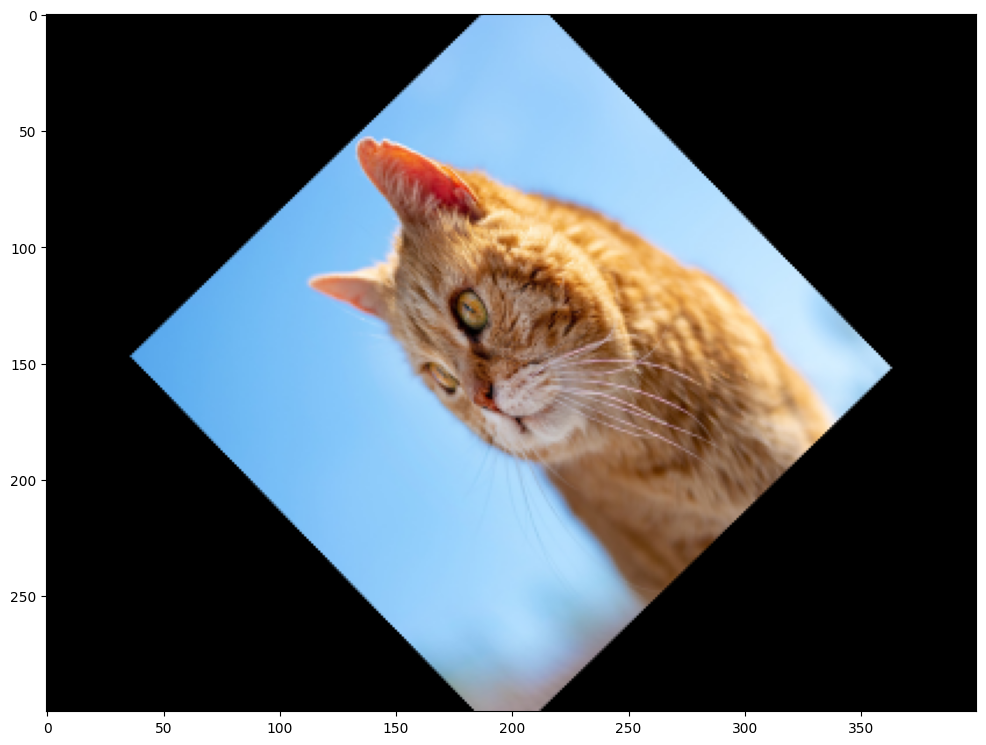

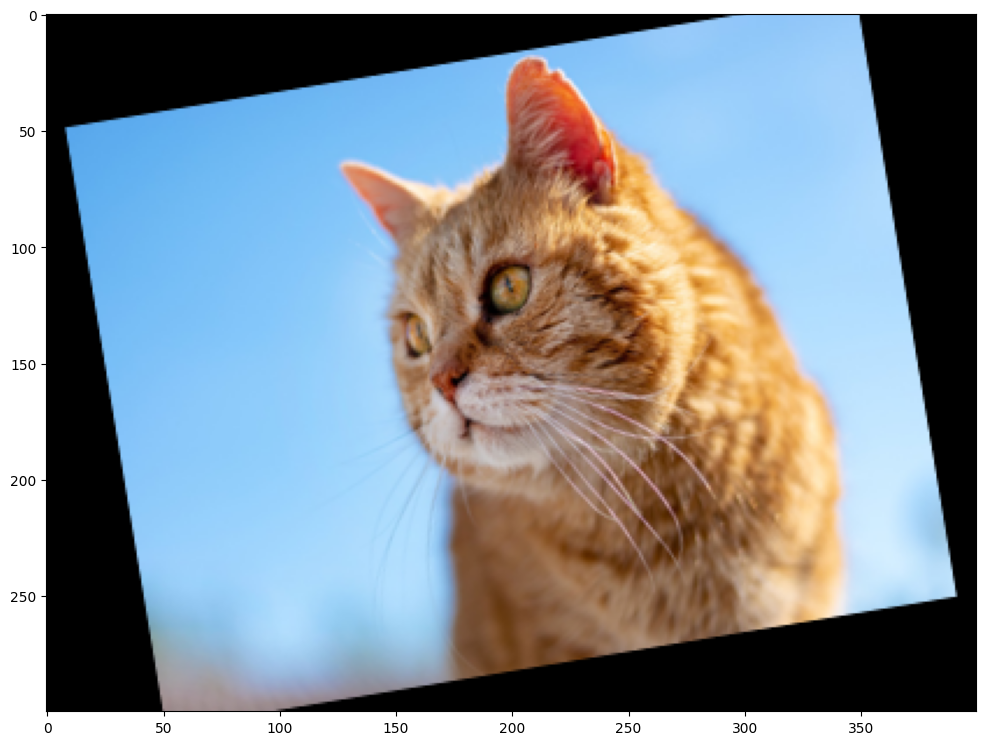

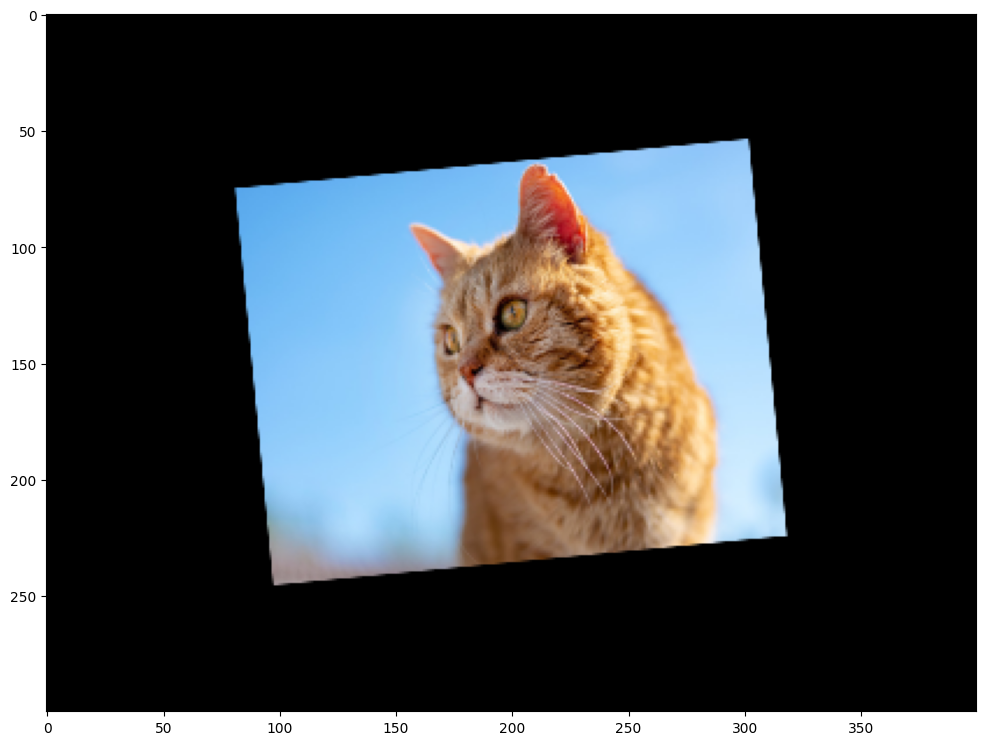

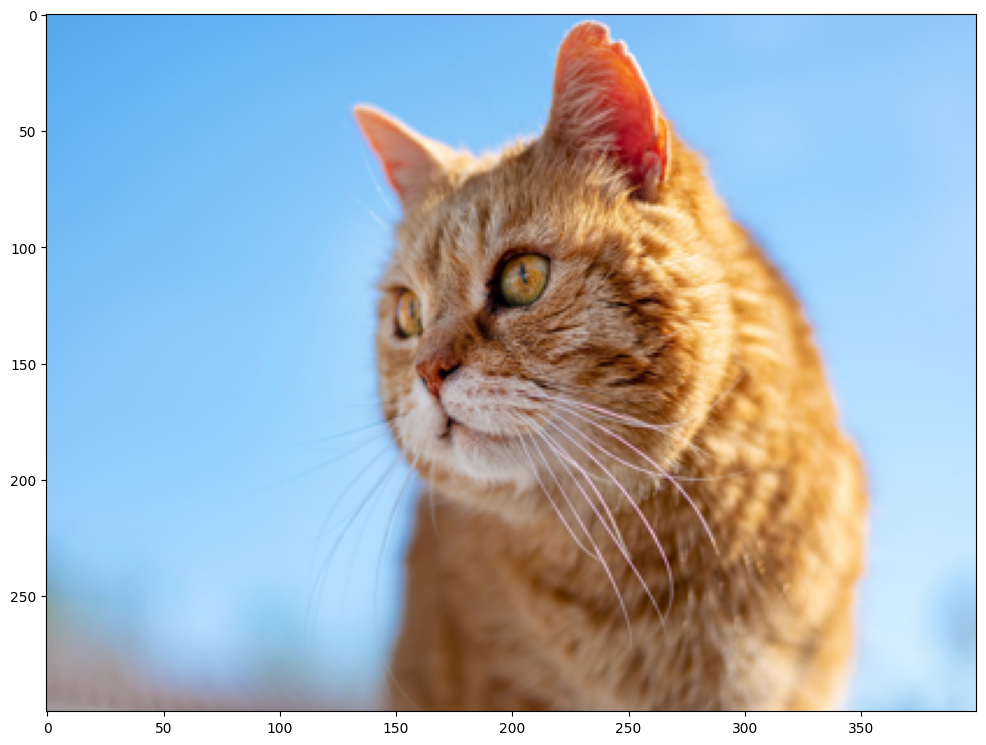

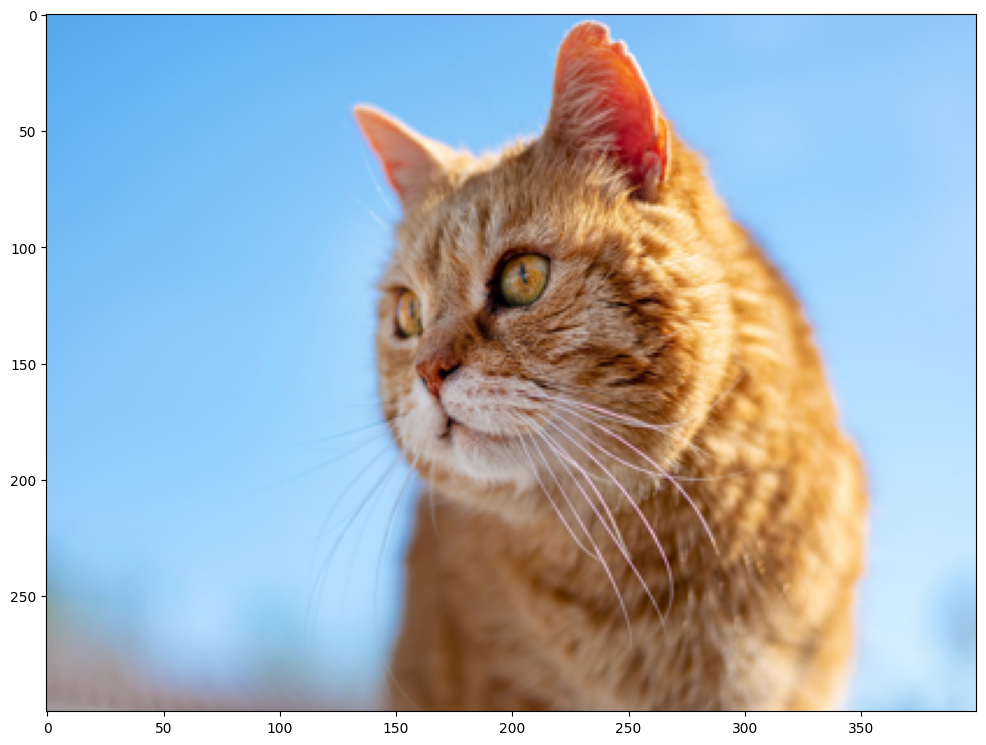

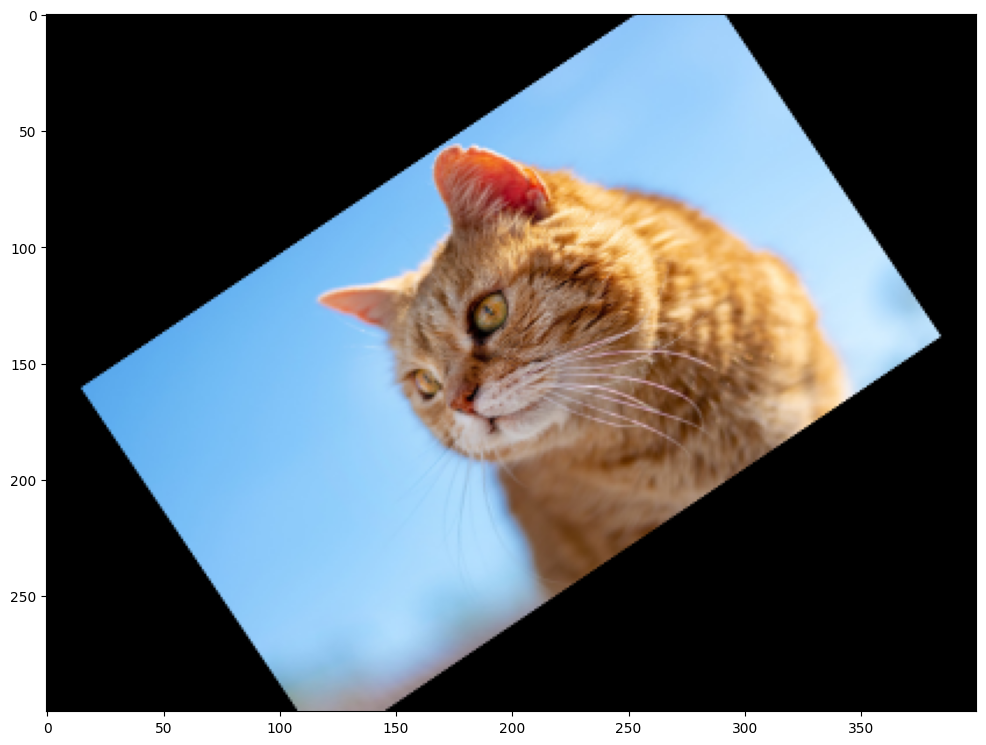

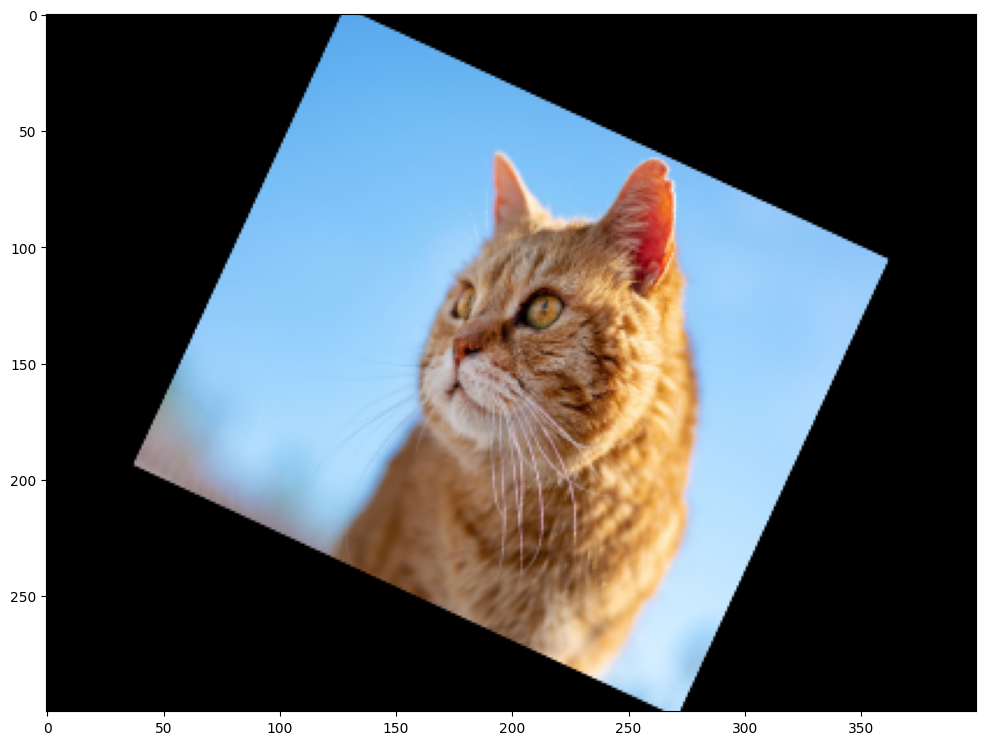

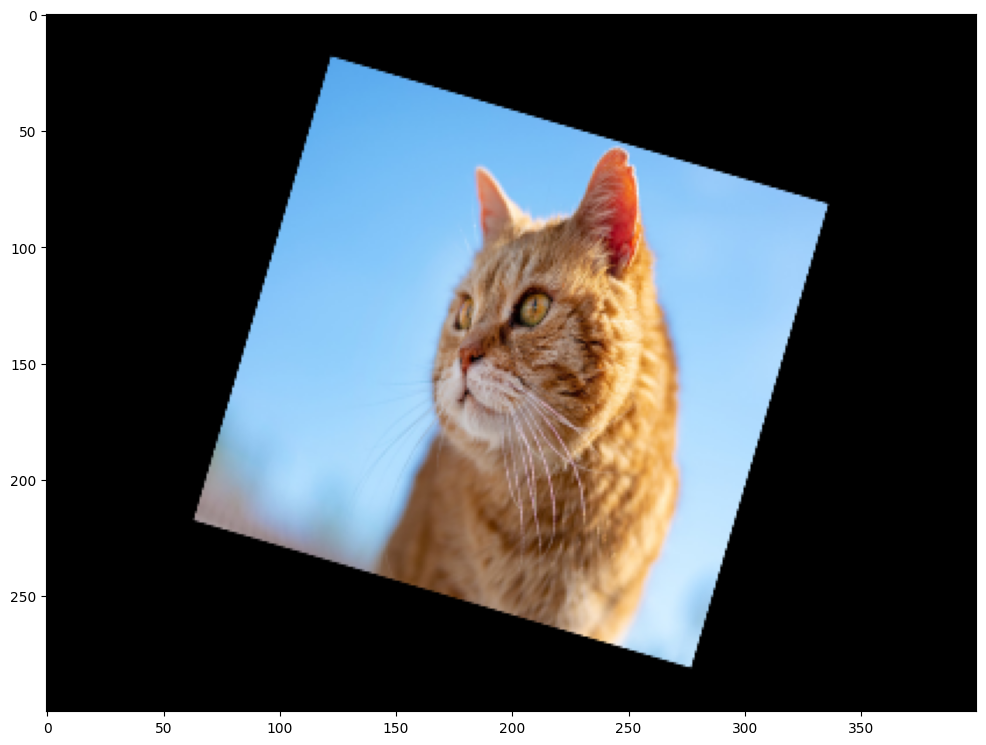

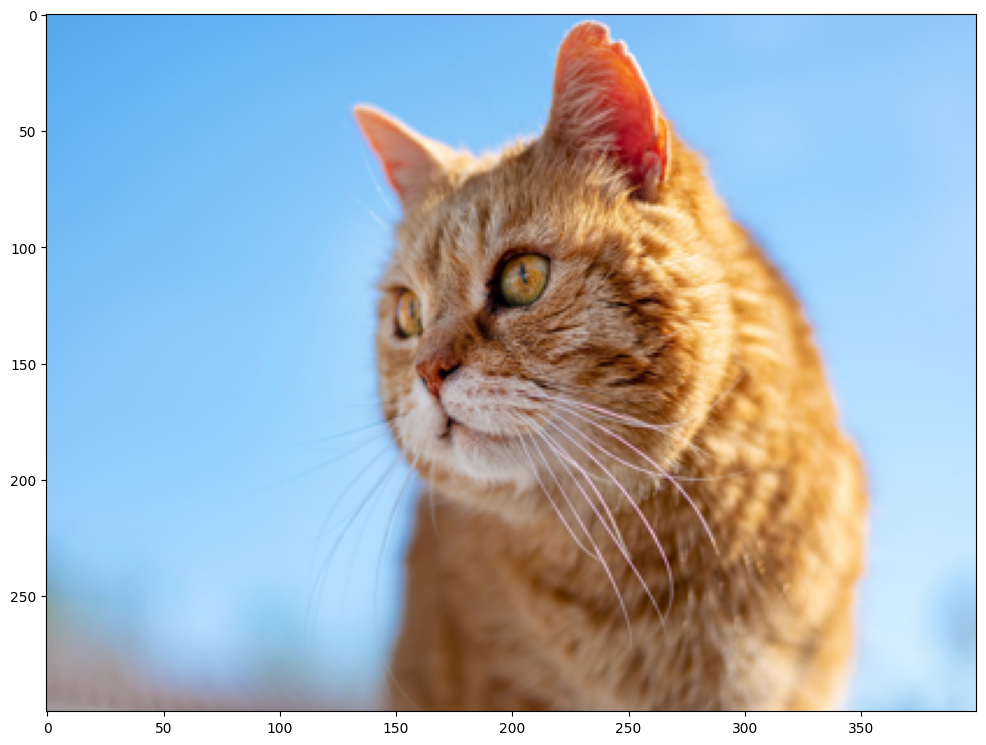

In [15]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

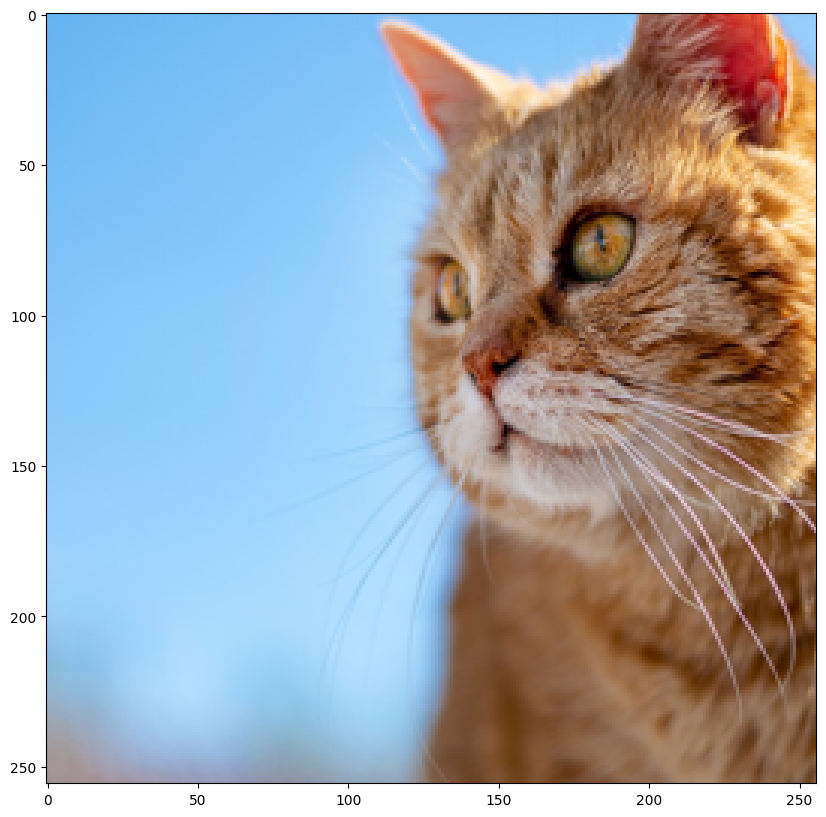

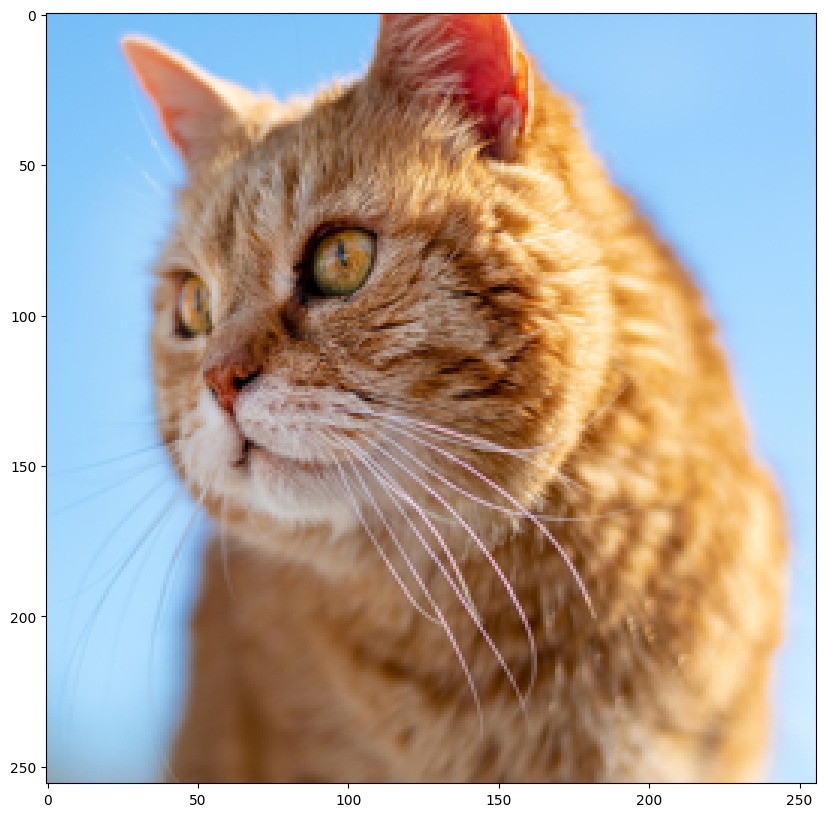

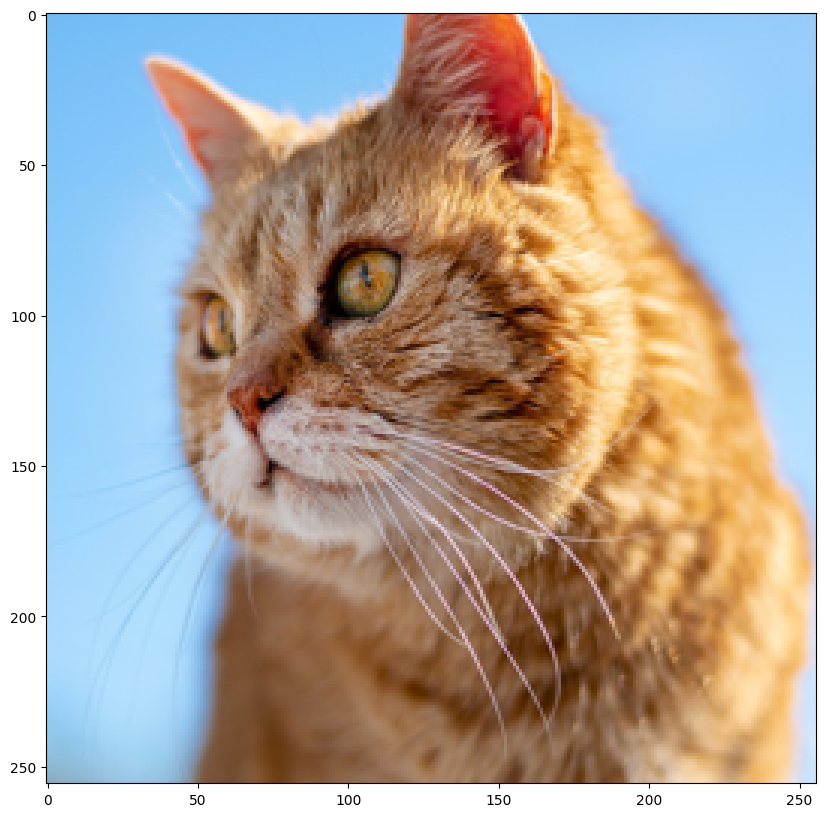

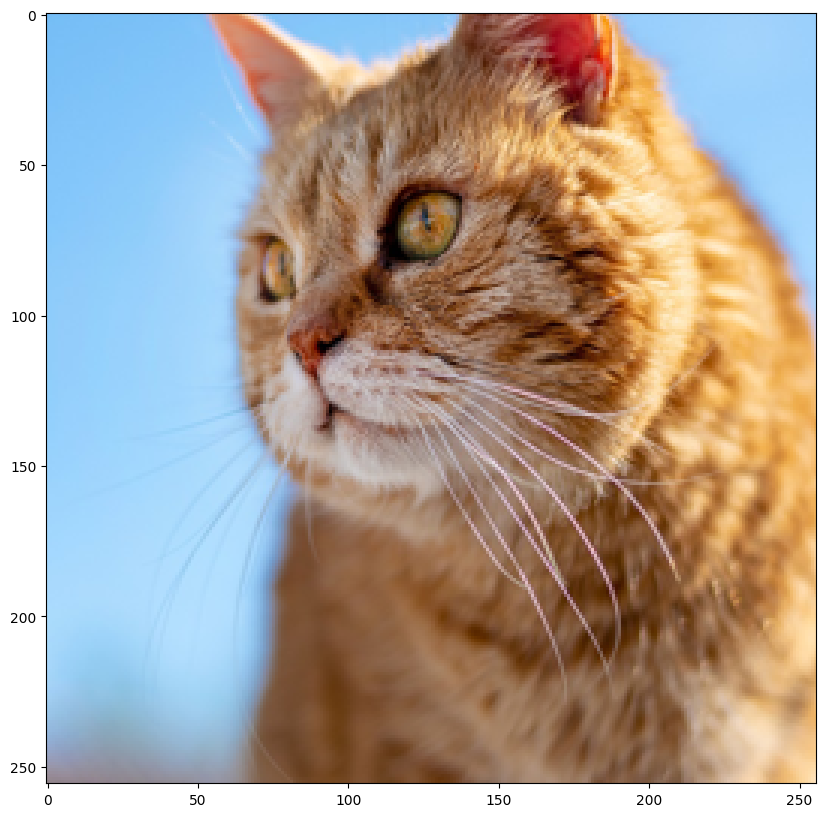

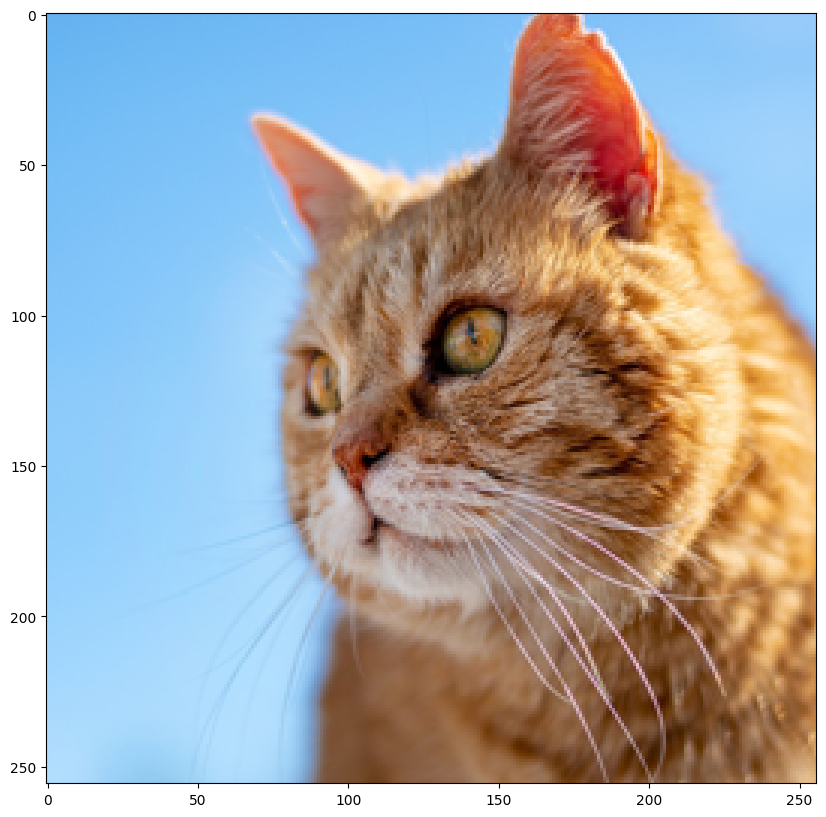

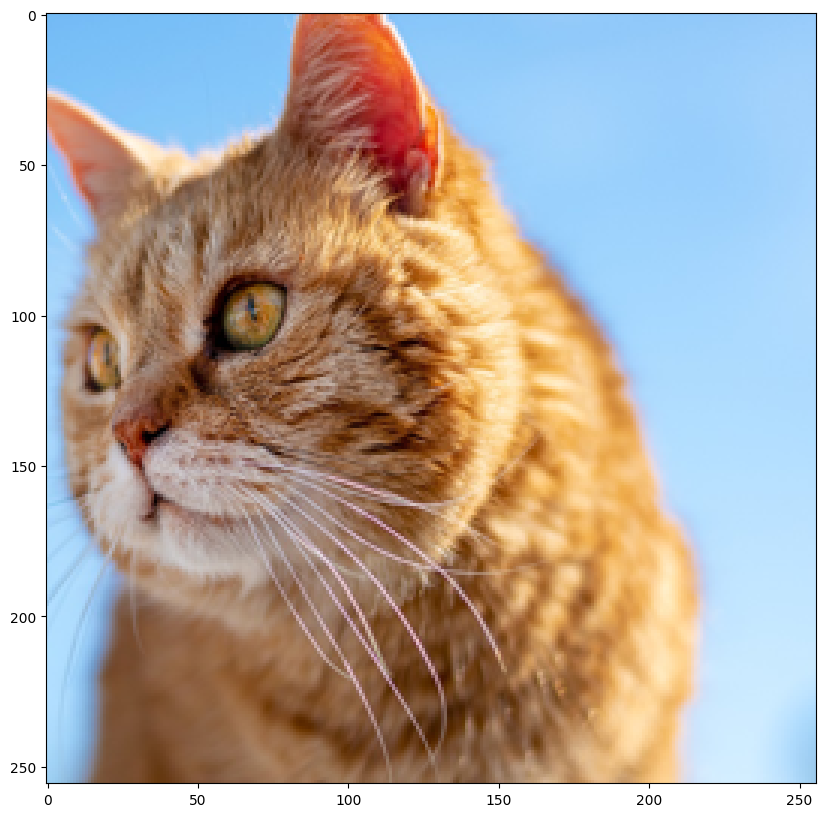

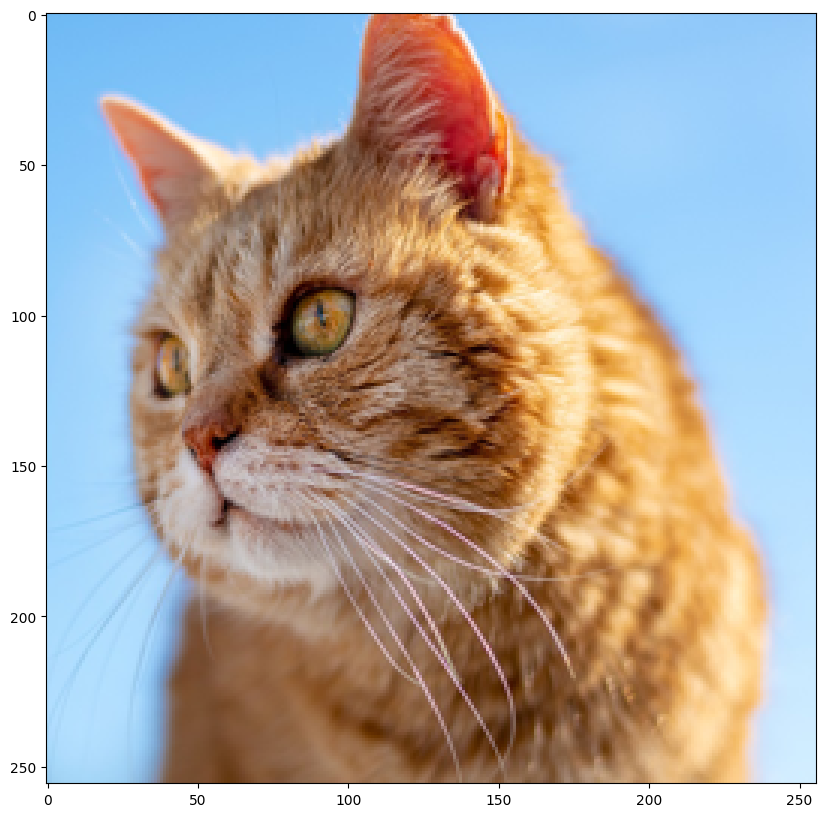

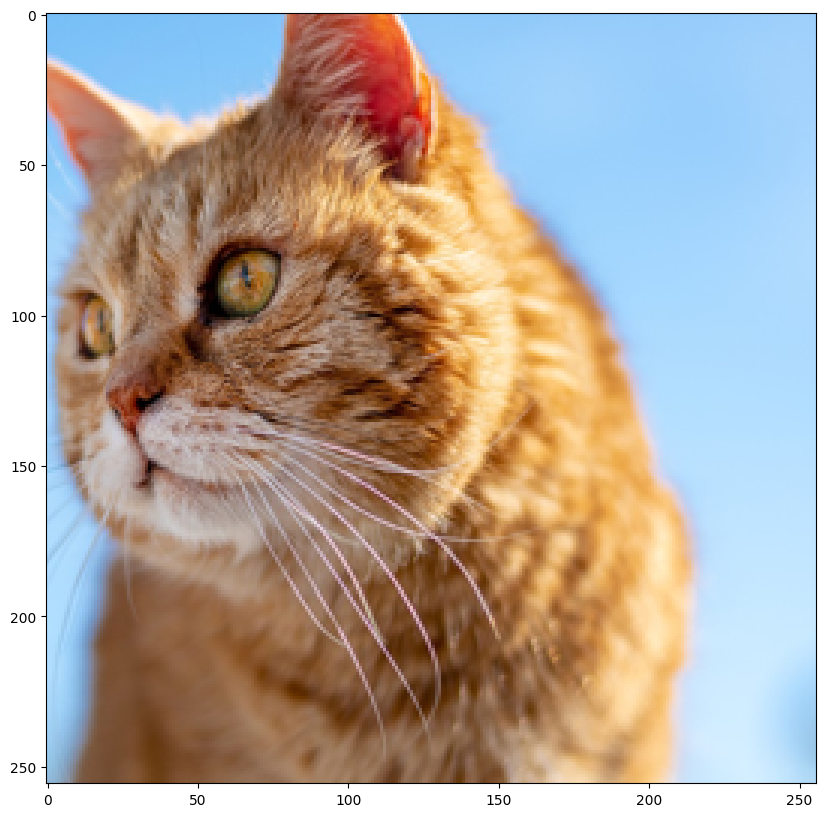

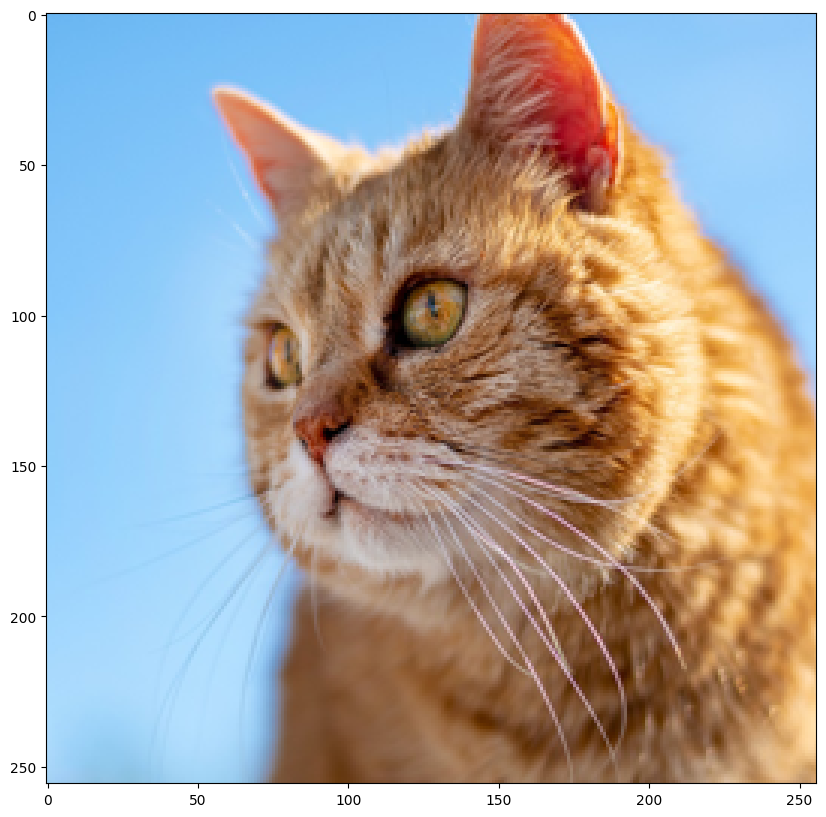

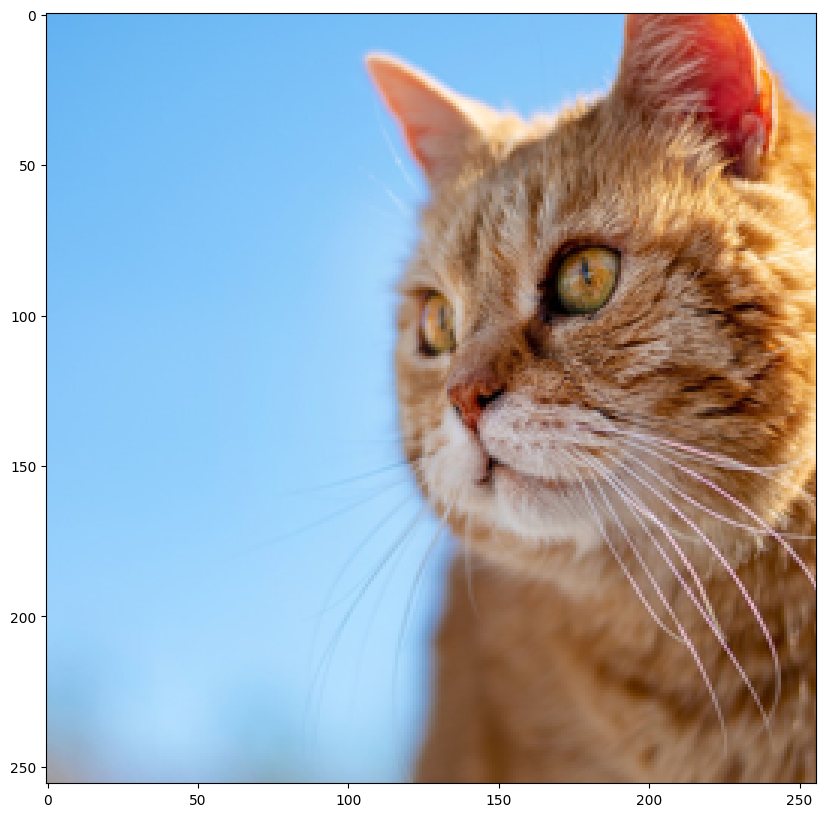

In [18]:
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

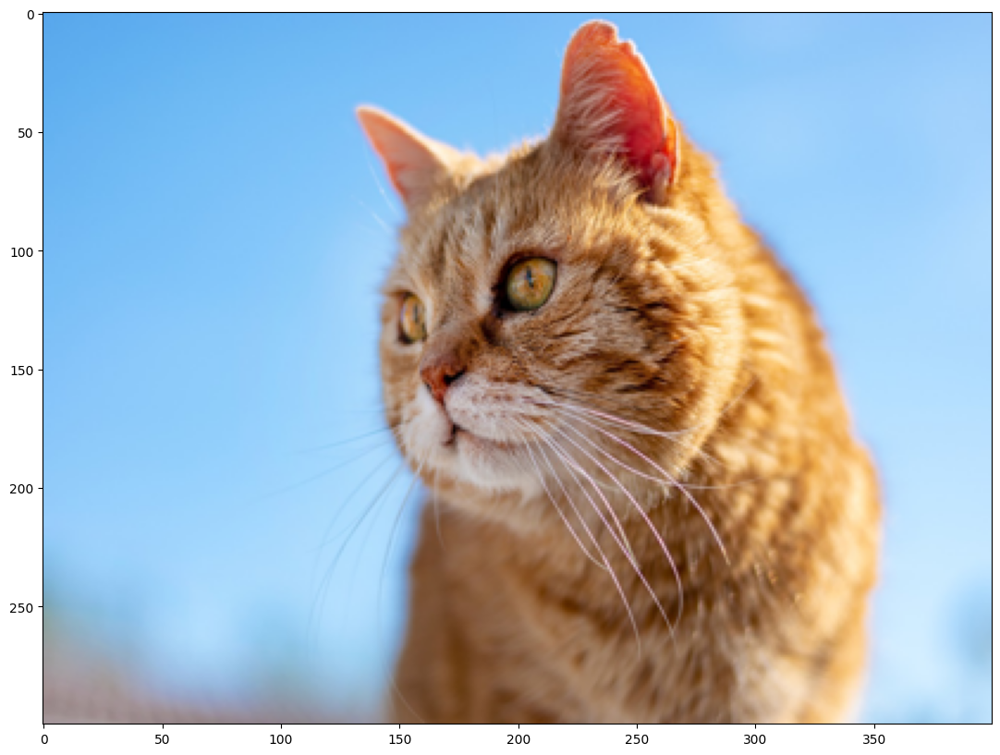

In [19]:
transform = A.Compose(
    [A.MedianBlur(blur_limit=7, p=0.5)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

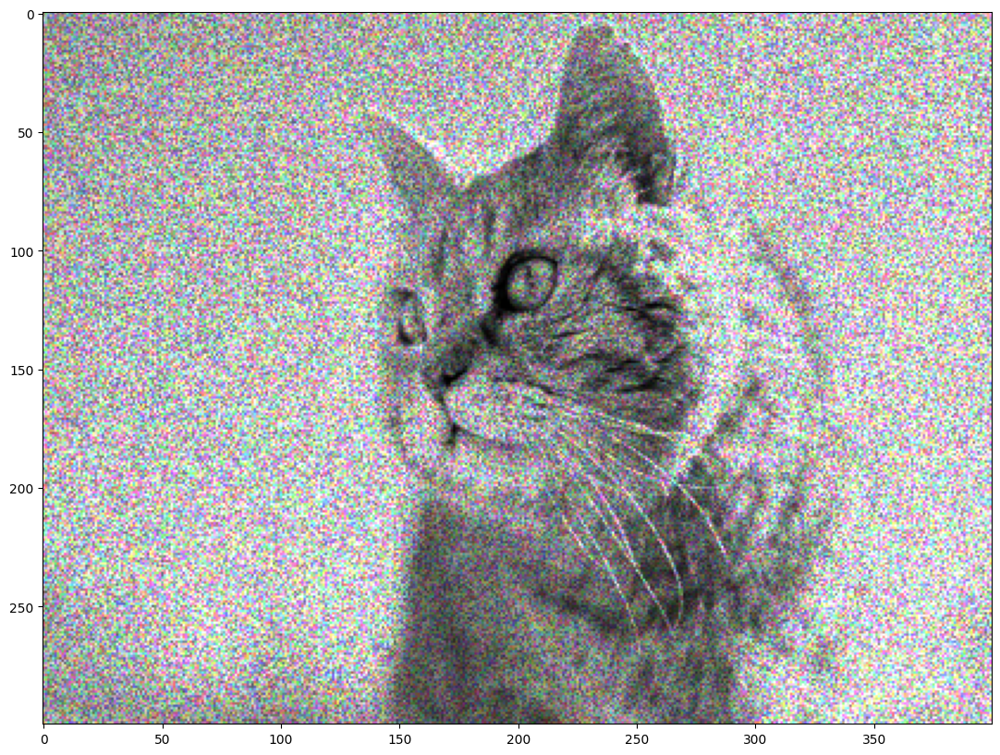

In [20]:
transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

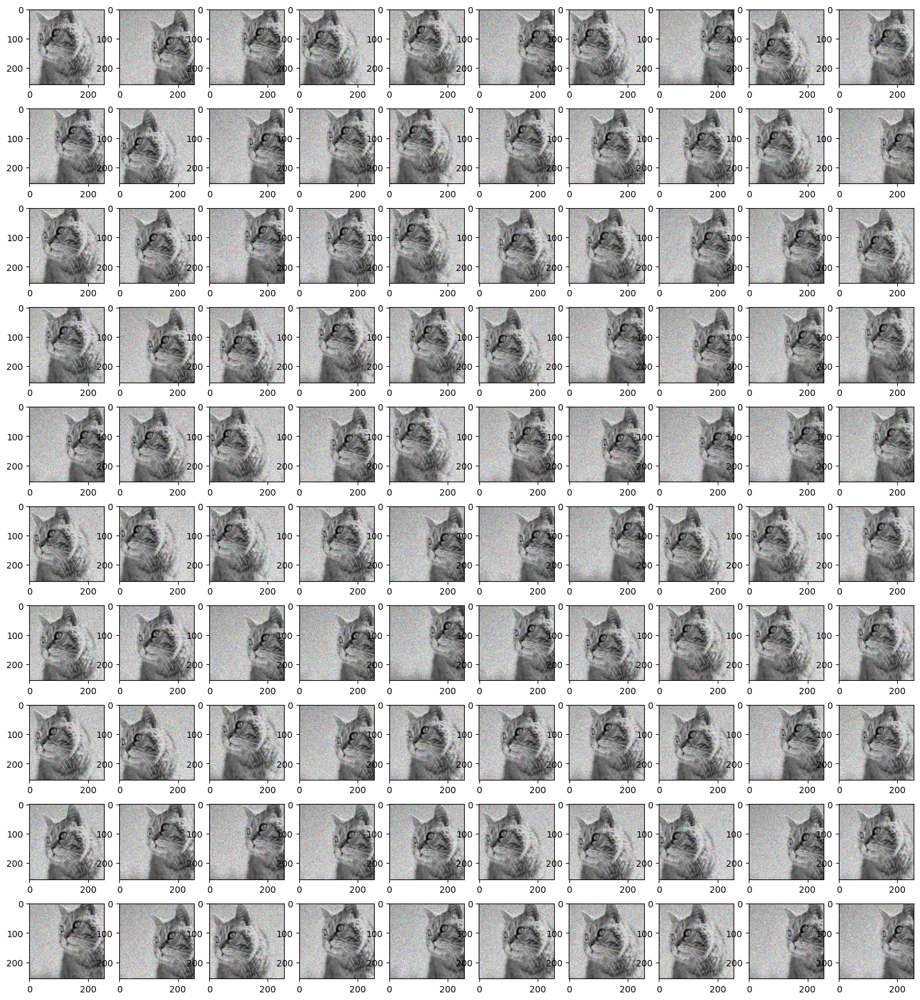

In [21]:
# Use various techniques and functions in albumentations library. show 100 images.

def transform_data(img_arr):
    transform = A.Compose(
        [
         A.ToGray(p=1), # hint : A.ToGray()
         A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1), # hint : A.MultiplicativeNoise()
         A.RandomCrop(width=256, height=256, p=1) # hint : A.RandomCrop()
        ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)